In [1]:
!jupyter nbconvert --ClearOutputPreprocessor.enabled=True \
  --to notebook project.ipynb --output project_clean.ipynb


[NbConvertApp] WARNING | pattern 'project.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
    Exe

In [ ]:
!wget -q https://github.com/Avaneesh40585/Flickr8k-Dataset/releases/download/v1.0/Flickr8k_Dataset.zip
!wget -q https://github.com/Avaneesh40585/Flickr8k-Dataset/releases/download/v1.0/Flickr8k_text.zip

!unzip -q Flickr8k_Dataset.zip -d ./flickr8k_images
!unzip -q Flickr8k_text.zip -d ./flickr8k_text


In [ ]:
from datasets import load_dataset
dataset = load_dataset("jxie/flickr8k")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/687 [00:00<?, ?B/s]

data/train-00000-of-00002-2f8f6bfa852eac(…):   0%|          | 0.00/414M [00:00<?, ?B/s]

data/train-00001-of-00002-2173151d8cd6c7(…):   0%|          | 0.00/414M [00:00<?, ?B/s]

data/validation-00000-of-00001-7025a2b59(…):   0%|          | 0.00/138M [00:00<?, ?B/s]

data/test-00000-of-00001-42a2661d12c73e4(…):   0%|          | 0.00/137M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/6000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/1000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1000 [00:00<?, ? examples/s]

In [ ]:
!mv ./flickr8k_images/Flicker8k_Dataset/* ./flickr8k_images/


In [ ]:
!rm -r ./flickr8k_images/Flicker8k_Dataset


In [ ]:
import os
print("Number of images:", len(os.listdir('./flickr8k_images')))
print("First 10 images:", os.listdir('./flickr8k_images')[:10])


Number of images: 8092
First 10 images: ['3546891929_f31a99cd0d.jpg', '3222842866_cb85243ce4.jpg', '123889082_d3751e0350.jpg', '1478294229_7e1c822fea.jpg', '2866696346_4dcccbd3a5.jpg', '3127142756_bf0bfcb571.jpg', '2701895972_8605c4e038.jpg', '987907964_5a06a63609.jpg', '3321956909_7b5ddf500f.jpg', '454709143_9c513f095c.jpg']


In [ ]:
captions_file = './flickr8k_text/Flickr8k.token.txt'

image_captions = {}
with open(captions_file, 'r') as f:
    for line in f:
        line = line.strip()
        if len(line) == 0:
            continue
        img_cap, caption = line.split('\t')
        img_name = img_cap.split('#')[0]
        if img_name not in image_captions:
            image_captions[img_name] = []
        image_captions[img_name].append(caption)

list(image_captions.items())[:2]


[('1000268201_693b08cb0e.jpg',
  ['A child in a pink dress is climbing up a set of stairs in an entry way .',
   'A girl going into a wooden building .',
   'A little girl climbing into a wooden playhouse .',
   'A little girl climbing the stairs to her playhouse .',
   'A little girl in a pink dress going into a wooden cabin .']),
 ('1001773457_577c3a7d70.jpg',
  ['A black dog and a spotted dog are fighting',
   'A black dog and a tri-colored dog playing with each other on the road .',
   'A black dog and a white dog with brown spots are staring at each other in the street .',
   'Two dogs of different breeds looking at each other on the road .',
   'Two dogs on pavement moving toward each other .'])]

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def preprocess_caption(text):
    text = text.lower()
    text = re.sub(r'[^a-z\s]', '', text)
    text = ' '.join([w for w in text.split() if w not in stop_words])
    return text

for img, caps in list(image_captions.items())[:5]:
    image_captions[img] = [preprocess_caption(c) for c in caps]
    print(img, image_captions[img])


1000268201_693b08cb0e.jpg ['child pink dress climbing set stairs entry way', 'girl going wooden building', 'little girl climbing wooden playhouse', 'little girl climbing stairs playhouse', 'little girl pink dress going wooden cabin']
1001773457_577c3a7d70.jpg ['black dog spotted dog fighting', 'black dog tricolored dog playing road', 'black dog white dog brown spots staring street', 'two dogs different breeds looking road', 'two dogs pavement moving toward']
1002674143_1b742ab4b8.jpg ['little girl covered paint sits front painted rainbow hands bowl', 'little girl sitting front large painted rainbow', 'small girl grass plays fingerpaints front white canvas rainbow', 'girl pigtails sitting front rainbow painting', 'young girl pigtails painting outside grass']
1003163366_44323f5815.jpg ['man lays bench dog sits', 'man lays bench white dog also tied', 'man sleeping bench outside white black dog sitting next', 'shirtless man lies park bench dog', 'man laying bench holding leash dog sitting 

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

all_captions = [' '.join(caps) for caps in image_captions.values()]


vectorizer = TfidfVectorizer(max_features=1000)
X_text = vectorizer.fit_transform(all_captions).toarray()

print("TF-IDF feature shape:", X_text.shape)


TF-IDF feature shape: (8092, 1000)


In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
import numpy as np

model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

def get_image_features(img_path):
    img = image.load_img(img_path, target_size=(224,224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x, verbose=0)
    return features.flatten()

image_files = list(image_captions.keys())[:100]
X_image = np.array([get_image_features('./flickr8k_images/' + img) for img in image_files])
print("Image feature shape:", X_image.shape)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Image feature shape: (100, 2048)


In [ ]:

X_text_subset = X_text[:len(image_files)]

X_combined = np.hstack((X_text_subset, X_image))
print("Combined feature shape:", X_combined.shape)


Combined feature shape: (100, 3048)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

pca = PCA(n_components=50)
X_reduced = pca.fit_transform(X_combined)

kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(X_reduced)

print("Cluster labels for first 10 images:", clusters[:10])


Cluster labels for first 10 images: [1 3 2 2 2 1 2 2 1 3]



Cluster 1:


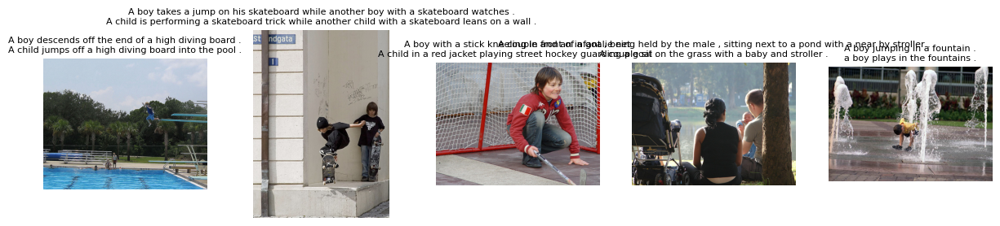


Cluster 3:


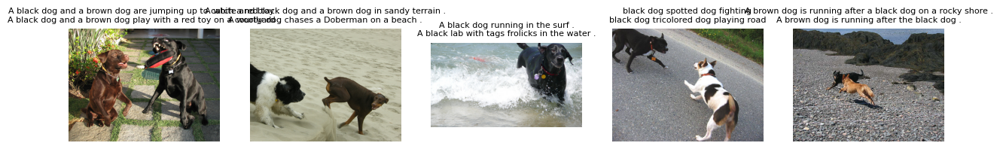


Cluster 2:


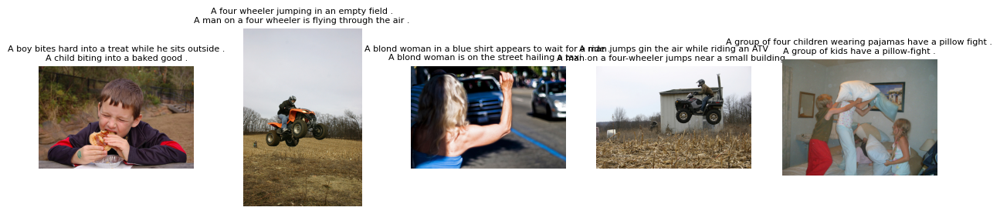


Cluster 4:


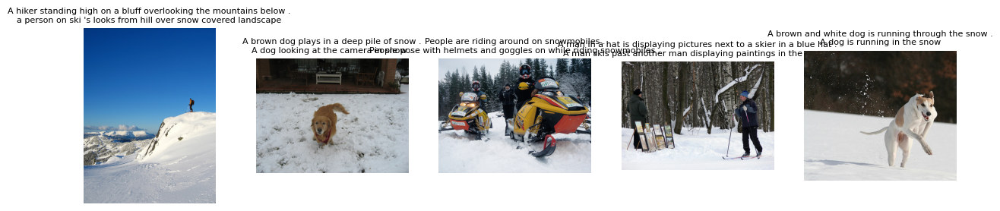


Cluster 0:


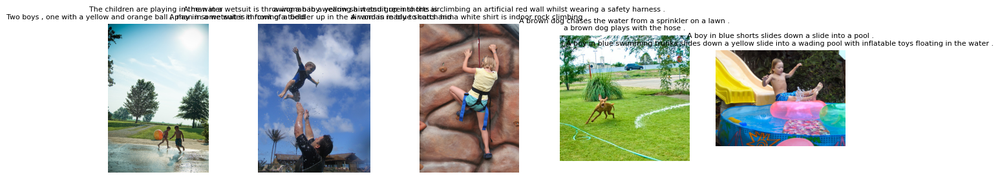

In [ ]:
import matplotlib.pyplot as plt
import random
from PIL import Image

cluster_to_images = {}
for img, label in zip(image_files, clusters):
    if label not in cluster_to_images:
        cluster_to_images[label] = []
    cluster_to_images[label].append(img)

for cluster_label, imgs in cluster_to_images.items():
    print(f"\nCluster {cluster_label}:")
    sample_imgs = random.sample(imgs, min(5, len(imgs)))
    plt.figure(figsize=(15,3))
    for i, img_name in enumerate(sample_imgs):
        img_path = './flickr8k_images/' + img_name
        img = Image.open(img_path)
        plt.subplot(1,5,i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title('\n'.join(image_captions[img_name][:2]), fontsize=8)
    plt.show()


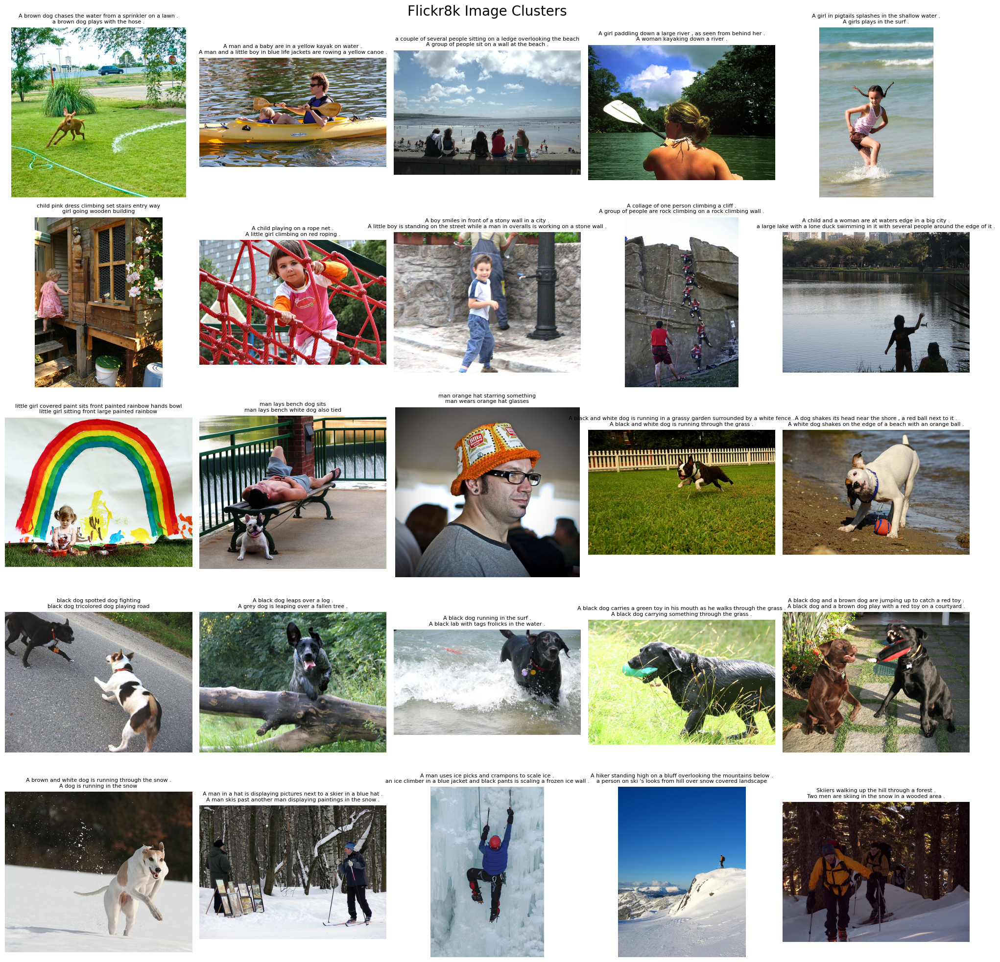

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math

images_per_cluster = 5
cluster_labels = sorted(set(clusters))

plt.figure(figsize=(20, len(cluster_labels)*4))

for idx, cluster_label in enumerate(cluster_labels):

    imgs_in_cluster = [img for img, lbl in zip(image_files, clusters) if lbl == cluster_label]

    sample_imgs = imgs_in_cluster[:images_per_cluster]

    for i, img_name in enumerate(sample_imgs):
        plt_idx = idx*images_per_cluster + i + 1
        plt.subplot(len(cluster_labels), images_per_cluster, plt_idx)
        img_path = './flickr8k_images/' + img_name
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis('off')
        plt.title('\n'.join(image_captions[img_name][:2]), fontsize=8)

plt.suptitle("Flickr8k Image Clusters", fontsize=20)
plt.tight_layout()
plt.show()


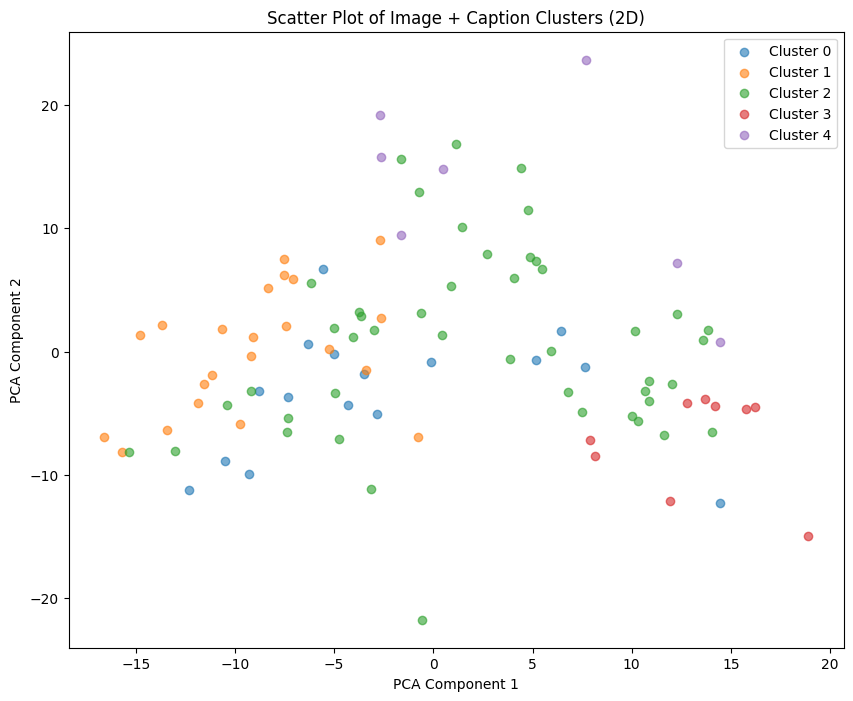

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X_combined)

plt.figure(figsize=(10,8))
for cluster_label in sorted(set(clusters)):
    idxs = [i for i, lbl in enumerate(clusters) if lbl == cluster_label]
    plt.scatter(X_2d[idxs, 0], X_2d[idxs, 1], label=f'Cluster {cluster_label}', alpha=0.6)

plt.title("Scatter Plot of Image + Caption Clusters (2D)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()
